<a href="https://colab.research.google.com/github/Difuze/Crime-Analysis-in-Los-Angeles/blob/main/Crimes_in_LosAngeles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Project Name :- Crime Severity Analysis : Los Angeles
###Project Type - EDA
Contribution - Team

Team Member 1 - Medha Jha

Team Member 2 - Harsh Jaiswal

#Project Summary



DR_NO: Unique identifier or reference number for each reported crime incident.

Date Rptd: The date when the crime incident was reported to the authorities.

DATE OCC: The date when the crime incident occurred.

TIME OCC: The time of day when the crime incident occurred.

AREA: Numerical code or identifier for a specific geographical area within a jurisdiction.

AREA NAME: The name or description of the geographical area associated with the reported crime, corresponding to the numerical code in the "AREA" column.

Rpt Dist No: Reporting district number or code within a larger jurisdiction.

Part 1-2: Indicates the type or category of the reported crime.

Crm Cd: Numerical code or identifier for the specific type of crime that was reported.

Crm Cd Desc: A textual description of the crime corresponding to the numerical code in the "Crm Cd" column.

Mocodes: Modus operandi (MO) codes, which may provide additional details or methods used in the commission of the crime.

Vict Age: Age of the victim.

Vict Sex: Gender of the victim.

Vict Descent: Descent or ethnicity of the victim.

Premis Cd: Numerical code or identifier for the type of premises where the crime occurred.

Premis Desc: Description of the premises corresponding to the numerical code in the "Premis Cd" column.

Weapon Used Cd: Numerical code or identifier for any weapon used in the crime.

Weapon Desc: Description of the weapon used, corresponding to the numerical code in the "Weapon Used Cd" column.

Status: Indicates the current status or disposition of the reported crime, such as whether it's an open case or has been resolved.

Status Desc: Textual description of the status of the reported crime, corresponding to the code in the "Status" column.

Crm Cd 1 - 	Indicates the crime committed. Crime Code 1 is the primary and most serious one. Crime Code 2, 3, and 4 are respectively less serious offenses. Lower crime class numbers are more serious.

Crm Cd 2 - May contain a code for an additional crime, less serious than Crime Code 1.

Crm Cd 3 - May contain a code for an additional crime, less serious than Crime Code 1.

Crm Cd 4 - May contain a code for an additional crime, less serious than Crime Code 1.


LOCATION: The address or location where the crime incident occurred.

Cross Street: The name of a cross street or intersection near the location of the crime.

LAT: Latitude coordinates representing the geographical location of the crime incident.

LON: Longitude coordinates representing the geographical location of the crime incident.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Crime_Data_from_2020_to_Present.csv")

In [ ]:
df["Vict Sex"].value_counts()

M    330101
F    294374
X     69025
H        88
-         1
Name: Vict Sex, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 798242 entries, 0 to 798241
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           798242 non-null  int64  
 1   Date Rptd       798242 non-null  object 
 2   DATE OCC        798242 non-null  object 
 3   TIME OCC        798242 non-null  int64  
 4   AREA            798242 non-null  int64  
 5   AREA NAME       798242 non-null  object 
 6   Rpt Dist No     798242 non-null  int64  
 7   Part 1-2        798242 non-null  int64  
 8   Crm Cd          798242 non-null  int64  
 9   Crm Cd Desc     798242 non-null  object 
 10  Mocodes         688290 non-null  object 
 11  Vict Age        798242 non-null  int64  
 12  Vict Sex        693589 non-null  object 
 13  Vict Descent    693581 non-null  object 
 14  Premis Cd       798233 non-null  float64
 15  Premis Desc     797770 non-null  object 
 16  Weapon Used Cd  277895 non-null  float64
 17  Weapon Des

In [ ]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


Converting Date Rptd and DateOCC into Datetime

In [ ]:
# Data Pre Processing
from datetime import datetime
def str_to_datetime(string):
  dd = datetime.strptime(string , "%m/%d/%Y %I:%M:%S %p")
  return dd

df['Date Rptd'] = df['Date Rptd'].apply(str_to_datetime)

In [ ]:
df["DATE OCC"] = df["DATE OCC"].apply(str_to_datetime)

In [ ]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,2020-01-08,2020-01-08,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,2020-01-02,2020-01-01,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,2020-04-14,2020-02-13,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,2020-01-01,2020-01-01,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,2020-01-01,2020-01-01,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


TIME column is not in proper date format so we will do some operation to get proper format


In [ ]:
df["TIME OCC"] = df["TIME OCC"].astype(str)

In [ ]:
# Coverting Time Occ column into proper format
def time_format(TIME):

  if len(TIME) == 4:
    hours = TIME[:2]
    mins = TIME[2:]

    return f"{hours}:{mins}"

  elif len(TIME) == 3:
    hours = '0'+TIME[:1]
    mins  = TIME[1:]

    return f"{hours}:{mins}"

  elif len(TIME) == 2:
    hours = '0'+TIME[:1]
    mins  = TIME[1:]+'0'

    return f"{hours}:{mins}"
  else:
    return TIME

df["TIME OCC"] = df["TIME OCC"].apply(time_format)

In [ ]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,2020-01-08,2020-01-08,22:30,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,2020-01-02,2020-01-01,03:30,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,2020-04-14,2020-02-13,12:00,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,2020-01-01,2020-01-01,17:30,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,2020-01-01,2020-01-01,04:15,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [ ]:
temp_df = df[df["Vict Age"] != 0]

<Figure size 2000x1200 with 0 Axes>

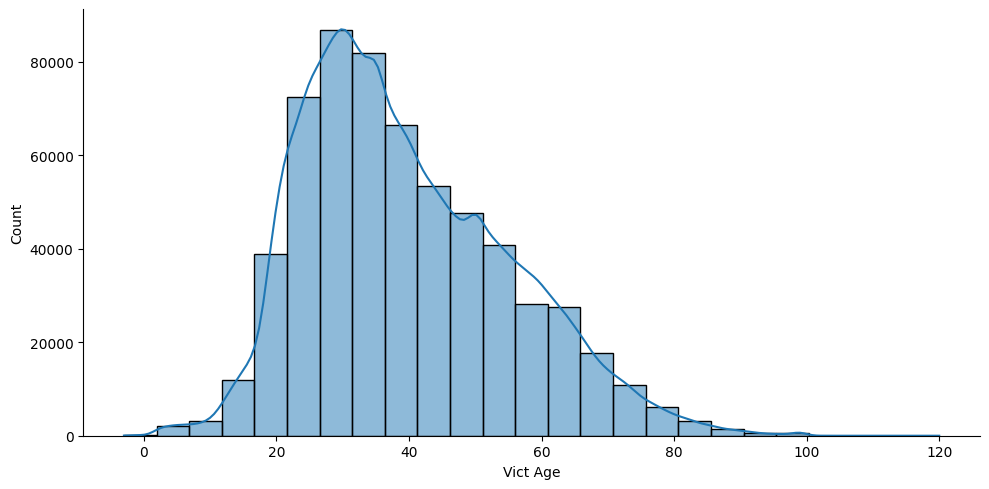

In [ ]:
plt.figure(figsize = (20,12))

sns.displot(temp_df["Vict Age"] , bins = 25 , kde = True , height = 5 , aspect = 2)

25 to 35 is the Most common age of the Victim in city of Lost Angeles

In [ ]:
temp_df1 = df[df['Vict Sex'] != "H"]

In [ ]:
sex_count = temp_df1["Vict Sex"].value_counts()

Text(0, 0.5, 'Count')

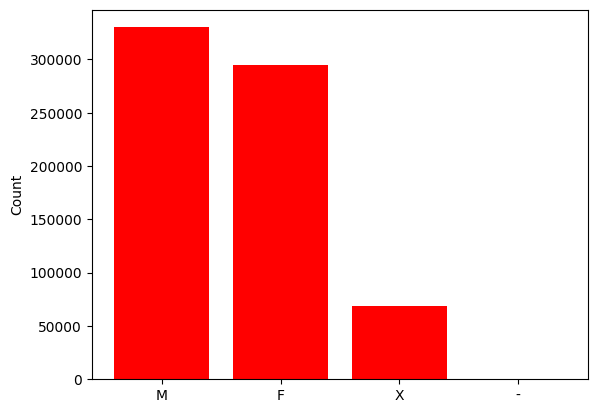

In [ ]:
plt.bar(sex_count.index , sex_count.values , color = "red")
plt.ylabel("Count")

Vict on basis of Male and Female are almost equal.


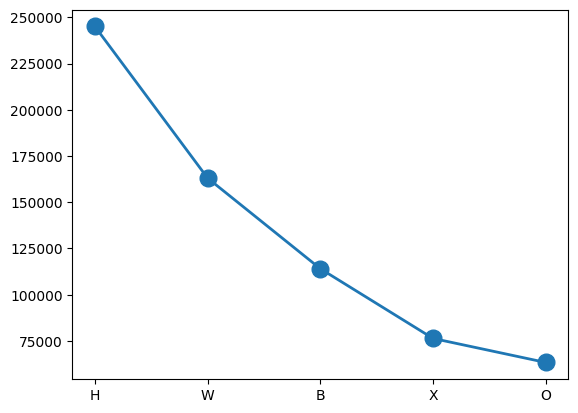

In [ ]:
descent_count = df['Vict Descent'].value_counts().head(5)

plt.plot(descent_count.index , descent_count.values , marker='o',linewidth=2, markersize=12)


Descent Code: A - Other Asian B - Black C - Chinese D - Cambodian F - Filipino G - Guamanian H - Hispanic/Latin/Mexican I - American Indian/Alaskan Native J - Japanese K - Korean L - Laotian O - Other P - Pacific Islander S - Samoan U - Hawaiian V - Vietnamese W - White X - Unknown Z - Asian Indian

Hispanic/Latin/Mexican ,White and Black these are the top 3 ethinicy Victims

In [ ]:
# Managing the catgories of the columns :-

df.loc[df["Crm Cd Desc"].str.contains("SIMPLE") ,"Crm Cd Desc" ] = "Simple Assualt"
df.loc[df["Crm Cd Desc"].str.contains("AGGRAVATED") ,"Crm Cd Desc" ] = "Aggravated Assualt"
df.loc[df["Crm Cd Desc"].str.contains("VANDALISM") ,"Crm Cd Desc" ] = "Vandalism & Misdeameanor"
df.loc[df["Crm Cd Desc"].str.contains("STOLEN") ,"Crm Cd Desc" ] = "Stoled"
df.loc[df["Crm Cd Desc"].str.contains("BURGLARY") ,"Crm Cd Desc" ] = "Burglary"
df.loc[df["Crm Cd Desc"].str.contains("MISCELLANEOUS") ,"Crm Cd Desc" ] = "Miscellaneous"
df.loc[df["Crm Cd Desc"].str.contains("ORDER") ,"Crm Cd Desc" ] = "Law and Order Violence"
df.loc[df["Crm Cd Desc"].str.contains("IDENTITY") ,"Crm Cd Desc" ] = "Identity theft"
df.loc[df["Crm Cd Desc"].str.contains("THEFT") ,"Crm Cd Desc" ] = "Theft"
df.loc[df["Crm Cd Desc"].str.contains("SEX") ,"Crm Cd Desc" ] = "Sexual Assualt"

In [ ]:
x = df["Crm Cd Desc"].value_counts().head()

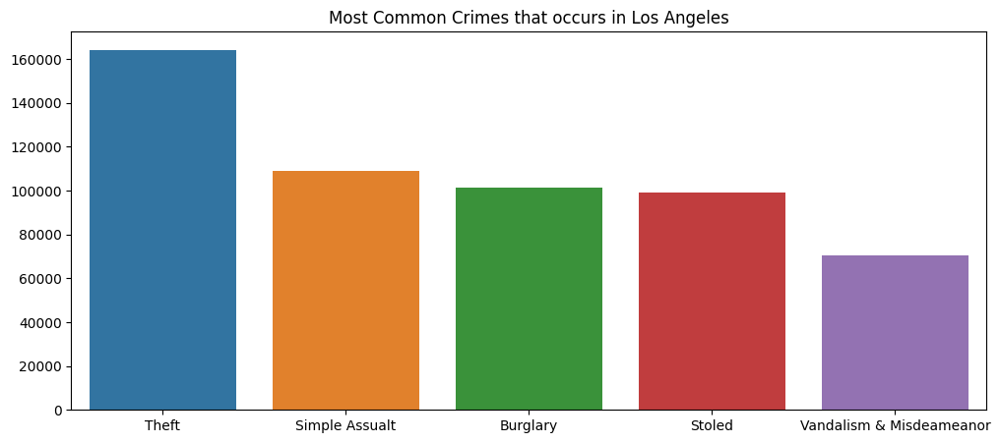

In [ ]:
plt.figure(figsize = (12,5))
sns.barplot(data = df, x = x.index , y = x.values)
plt.title("Most Common Crimes that occurs in Los Angeles")
plt.show()

## Theft, Simple Assualt, Burglary and Stoled are the top crimes that happens in Los Angeles

In [ ]:
# Making a news column Age_grp so we can categorise easily for further analysis

def age_1(df):
    age_group = []

    for index, row in df.iterrows():
        if row['Vict Age'] < 18:
            age_group.append('Underage')
        elif 18 <= row['Vict Age'] < 45:
            age_group.append('Adult')
        elif row['Vict Age'] >= 45:
            age_group.append('Senior')
        else:
            age_group.append(pd.NA)

    df['Age_Grp'] = age_group
    return df

In [ ]:
df = age_1(df)

In [ ]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Age_Grp
0,10304468,2020-01-08,2020-01-08,22:30,3,Southwest,377,2,624,Simple Assualt,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978,Adult
1,190101086,2020-01-02,2020-01-01,03:30,1,Central,163,2,624,Simple Assualt,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545,Adult
2,200110444,2020-04-14,2020-02-13,12:00,1,Central,155,2,845,Sexual Assualt,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474,Underage
3,191501505,2020-01-01,2020-01-01,17:30,15,N Hollywood,1543,2,745,Vandalism & Misdeameanor,0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019,Senior
4,191921269,2020-01-01,2020-01-01,04:15,19,Mission,1998,2,740,Vandalism & Misdeameanor,0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468,Adult


In [ ]:
import pandas as pd

# Assuming df is your DataFrame

# Define a function to extract information and create a new column
def process_crime_type(crime_type):
    if '(' in crime_type and ')' in crime_type:
        bracket_content = crime_type[crime_type.find('(') + 1:crime_type.find(')')]
        return bracket_content
    else:
        return None

# Apply the function to create a new column
df['Additional_Info'] = df['Crm Cd Desc'].apply(process_crime_type)

# Remove the bracketed terms from the original 'Crime_Type' column
df['Crm Cd Desc'] = df['Crm Cd Desc'].replace(to_replace=r'\(.*\)', value='', regex=True).str.strip()

In [ ]:
# managing Crm Cd as 1 column on bais of crime severity

for index, row in df.iterrows():
    if pd.notna(row['Crm Cd 1']) and pd.isna(row['Crm Cd 2']) and pd.isna(row['Crm Cd 3']) and pd.isna(row['Crm Cd 4']):
        df.at[index, 'Severity_crime_level'] = 4
    elif pd.notna(row['Crm Cd 1']) and pd.notna(row['Crm Cd 2']) and pd.isna(row['Crm Cd 3']) and pd.isna(row['Crm Cd 4']):
        df.at[index, 'Severity_crime_level'] = 3
    elif pd.notna(row['Crm Cd 1']) and pd.notna(row['Crm Cd 2']) and pd.notna(row['Crm Cd 3']) and pd.isna(row['Crm Cd 4']):
        df.at[index, 'Severity_crime_level'] = 2
    elif pd.notna(row['Crm Cd 1']) and pd.notna(row['Crm Cd 2']) and pd.notna(row['Crm Cd 3']) and pd.notna(row['Crm Cd 4']):
        df.at[index, 'Severity_crime_level'] = 1

df.drop(['Crm Cd 1','Crm Cd 2','Crm Cd 3','Crm Cd 4'],axis=1,inplace=True)

In [ ]:
Underage = df[df["Age_Grp"] == "Underage"]
Underage_c = Underage["Crm Cd Desc"].value_counts().sort_values(ascending = False).head(5)

Adult = df[df["Age_Grp"] == "Adult"]
Adult_c = Adult["Crm Cd Desc"].value_counts().sort_values(ascending = False).head(5)

Senior = df[df["Age_Grp"] == "Senior"]
Senior_c = Senior["Crm Cd Desc"].value_counts().sort_values(ascending = False).head(5)

In [ ]:
print("Total Number of Crime Ocuured wiht Underage : " , Underage_c.sum())
print("Total Number of Crime Ocuured wiht Adult : " , Adult_c.sum())
print("Total Number of Crime Ocuured wiht Senior : " , Senior_c.sum())

Total Number of Crime Ocuured wiht Underage :  179056
Total Number of Crime Ocuured wiht Adult :  262547
Total Number of Crime Ocuured wiht Senior :  145489


Adult age Groups faces most of the Crimes in Los Angeles

<ipython-input-180-b5c88f2916f1>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(231)


Text(0.5, 1.0, 'Senior vs Crime Type')

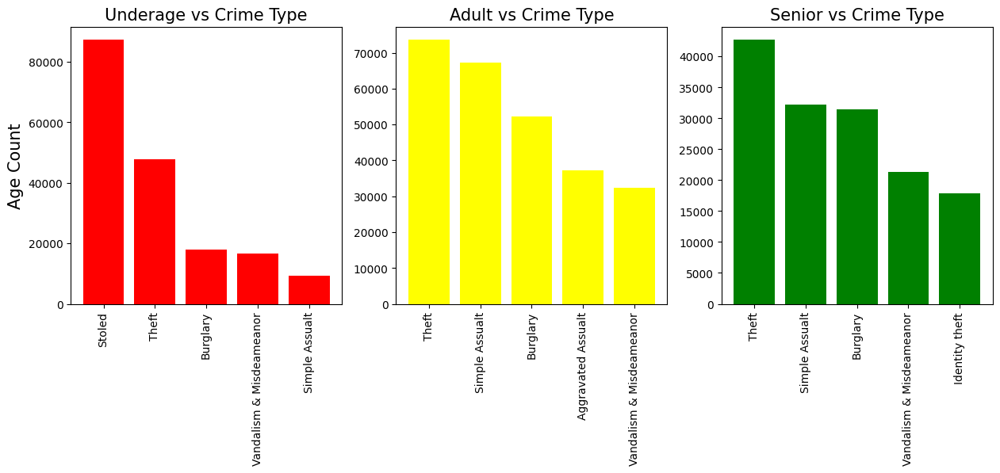

In [ ]:
plt.subplots(figsize=(15,10))
width1 = 0.5

plt.subplot(231)
plt.xticks(rotation = "vertical")
plt.bar(Underage_c.index ,Underage_c.values, color = "red")
plt.title("Underage vs Crime Type" ,  fontsize=15)
plt.ylabel("Age Count",fontsize=15)

plt.subplot(232)
plt.xticks(rotation = "vertical")
plt.bar(Adult_c.index ,Adult_c.values , color = "yellow")
plt.title("Adult vs Crime Type" , fontsize=15)

plt.subplot(233)
plt.xticks(rotation = "vertical")
plt.bar(Senior_c.index ,Senior_c.values , color = "green")
plt.title("Senior vs Crime Type" , fontsize=15)


From the above figure we can understand that Theft is most common crimes against the different age groups.

Simple Assults are common between Adults and Seniors


In [ ]:
Underage_F = Underage[Underage["Vict Sex"] == "F"]["Crm Cd Desc"].value_counts().head(5)
Underage_M = Underage[Underage["Vict Sex"] == "M"]["Crm Cd Desc"].value_counts().head(5)

Senior_F = Senior[Senior["Vict Sex"] == "F"]["Crm Cd Desc"].value_counts().head(5)
Senior_M = Senior[Senior["Vict Sex"] == "M"]["Crm Cd Desc"].value_counts().head(5)

Adult_F = Adult[Adult["Vict Sex"] == "F"]["Crm Cd Desc"].value_counts().head(5)
Adult_M = Adult[Adult["Vict Sex"] == "M"]["Crm Cd Desc"].value_counts().head(5)

<ipython-input-182-407532ea3a24>:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[i // 2, i % 2].set_xticklabels(x, rotation='vertical')


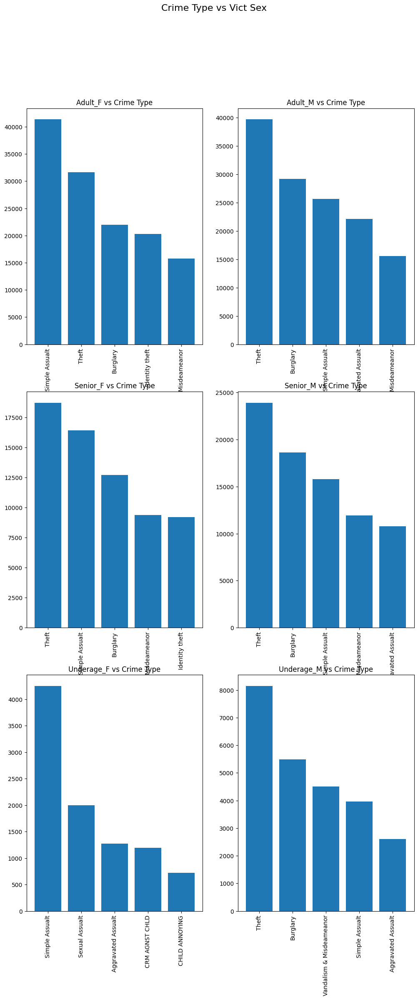

In [ ]:
fig, axs = plt.subplots(3, 2 , figsize = (12,25))

# Define the data and labels in a structured way
data = [
    (Adult_F.index, Adult_F.values),
    (Adult_M.index, Adult_M.values),
    (Senior_F.index, Senior_F.values),
    (Senior_M.index, Senior_M.values),
    (Underage_F.index, Underage_F.values),
    (Underage_M.index, Underage_M.values)
]

# Titles for each subplot
titles = [
    'Adult_F vs Crime Type',
    'Adult_M vs Crime Type',
    'Senior_F vs Crime Type',
    'Senior_M vs Crime Type',
    'Underage_F vs Crime Type',
    'Underage_M vs Crime Type'
]

# Plotting in a loop and setting rotation for x-axis tick labels
for i, (x, y) in enumerate(data):
    axs[i // 2, i % 2].bar(x, y)
    axs[i // 2, i % 2].set_xticklabels(x, rotation='vertical')
    axs[i // 2, i % 2].set_title(titles[i])

fig.suptitle("Crime Type vs Vict Sex" , fontsize = 16)
plt.show()

Theft, Simple Assault and Burglary is the most common cirme againt all type if age grp and sex.

But Under Age Female Faces Sexual Assault more than Adult and senior Female
these is a very serious Issue in our society.

In [ ]:
# Making a news from Time Occ to Time Grp so it can become easy to analyze

def time_1(df):
    time_group = []

    for index, row in df.iterrows():
        if int(row['TIME OCC'].split(':')[0]) >=0 and int(row['TIME OCC'].split(':')[0])<6:
            time_group.append('Early Morning')
        elif int(row['TIME OCC'].split(':')[0]) >=6 and int(row['TIME OCC'].split(':')[0])<12:
            time_group.append('Morning')
        elif int(row['TIME OCC'].split(':')[0]) >=12 and int(row['TIME OCC'].split(':')[0])<16:
            time_group.append('Afternoon')
        elif int(row['TIME OCC'].split(':')[0]) >=16 and int(row['TIME OCC'].split(':')[0])<22:
            time_group.append('Evening')
        elif int(row['TIME OCC'].split(':')[0]) >=22 and int(row['TIME OCC'].split(':')[0])<24:
            time_group.append('Late Night')
        else:
            time_group.append(pd.NA)

    df['Time_grp'] = time_group
    return df

df = time_1(df)

In [ ]:
time_c = df["Time_grp"].value_counts()

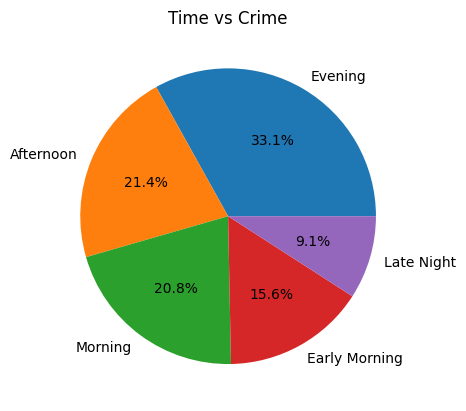

In [ ]:
plt.pie(time_c , autopct = "%.1f%%", labels = time_c.index)
plt.title("Time vs Crime")
plt.show()

Most the Crimes Occurs in the evening time, After noon and evening are almost the same.

In [ ]:
df["AREA NAME"].value_counts().head().reset_index().rename(columns={'index': 'city',"AREA NAME":"No. of Crimes"})

,city,No. of Crimes
0,Central,53605
1,77th Street,50450
2,Pacific,46629
3,Southwest,44645
4,Hollywood,42408


These are the top 5 areas where most crimes happens

In [ ]:
dd = df["Age_Grp"].value_counts()

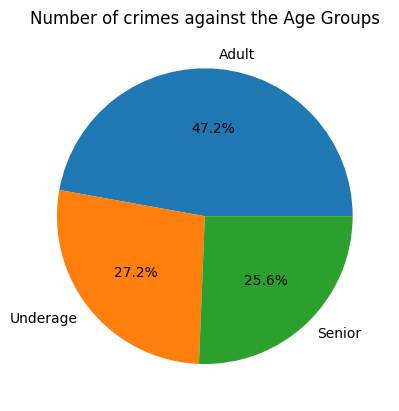

In [ ]:
plt.title("Number of crimes against the Age Groups")
plt.pie(dd.values,autopct = "%1.1f%%",labels = dd.index)
plt.show()

Adult age grp have faced most of the Crimes here Adults are very domonating.

In [ ]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,LOCATION,Cross Street,LAT,LON,Age_Grp,Additional_Info,Severity_crime_level,Time_grp
0,10304468,2020-01-08,2020-01-08,22:30,3,Southwest,377,2,624,Simple Assualt,0444 0913,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,NaN,34.0141,-118.2978,Adult,None,4.0,Late Night
1,190101086,2020-01-02,2020-01-01,03:30,1,Central,163,2,624,Simple Assualt,0416 1822 1414,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,NaN,34.0459,-118.2545,Adult,None,4.0,Early Morning
2,200110444,2020-04-14,2020-02-13,12:00,1,Central,155,2,845,Sexual Assualt,1501,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,200 E 6TH ST,NaN,34.0448,-118.2474,Underage,None,4.0,Afternoon
3,191501505,2020-01-01,2020-01-01,17:30,15,N Hollywood,1543,2,745,Vandalism & Misdeameanor,0329 1402,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,5400 CORTEEN PL,NaN,34.1685,-118.4019,Senior,None,3.0,Evening
4,191921269,2020-01-01,2020-01-01,04:15,19,Mission,1998,2,740,Vandalism & Misdeameanor,0329,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,14400 TITUS ST,NaN,34.2198,-118.4468,Adult,None,4.0,Early Morning


In [ ]:
df.drop(columns = ["AREA" , "Mocodes"])

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,LOCATION,Cross Street,LAT,LON,Age_Grp,Additional_Info,Severity_crime_level,Time_grp
0,10304468,2020-01-08,2020-01-08,22:30,Southwest,377,2,624,Simple Assualt,36,F,B,501.0,SINGLE FAMILY DWELLING,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,1100 W 39TH PL,NaN,34.0141,-118.2978,Adult,None,4.0,Late Night
1,190101086,2020-01-02,2020-01-01,03:30,Central,163,2,624,Simple Assualt,25,M,H,102.0,SIDEWALK,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,700 S HILL ST,NaN,34.0459,-118.2545,Adult,None,4.0,Early Morning
2,200110444,2020-04-14,2020-02-13,12:00,Central,155,2,845,Sexual Assualt,0,X,X,726.0,POLICE FACILITY,NaN,NaN,AA,Adult Arrest,200 E 6TH ST,NaN,34.0448,-118.2474,Underage,None,4.0,Afternoon
3,191501505,2020-01-01,2020-01-01,17:30,N Hollywood,1543,2,745,Vandalism & Misdeameanor,76,F,W,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,5400 CORTEEN PL,NaN,34.1685,-118.4019,Senior,None,3.0,Evening
4,191921269,2020-01-01,2020-01-01,04:15,Mission,1998,2,740,Vandalism & Misdeameanor,31,X,X,409.0,BEAUTY SUPPLY STORE,NaN,NaN,IC,Invest Cont,14400 TITUS ST,NaN,34.2198,-118.4468,Adult,None,4.0,Early Morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
798237,231604807,2023-01-27,2023-01-26,18:00,Foothill,1663,2,740,Vandalism & Misdeameanor,23,M,H,122.0,"VEHICLE, PASSENGER/TRUCK",NaN,NaN,IC,Invest Cont,12500 BRANFORD ST,NaN,34.2466,-118.4054,Adult,None,4.0,Evening
798238,231606525,2023-03-22,2023-03-22,10:00,Foothill,1602,1,230,Aggravated Assualt,25,F,H,102.0,SIDEWALK,400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,12800 FILMORE ST,NaN,34.2790,-118.4116,Adult,None,4.0,Morning
798239,231210064,2023-04-12,2023-04-12,16:30,77th Street,1239,1,230,Aggravated Assualt,29,M,B,222.0,LAUNDROMAT,500.0,UNKNOWN WEAPON/OTHER WEAPON,IC,Invest Cont,6100 S VERMONT AV,NaN,33.9841,-118.2915,Adult,None,4.0,Evening
798240,230115220,2023-07-02,2023-07-01,1,Central,154,1,352,PICKPOCKET,24,F,H,735.0,NIGHT CLUB (OPEN EVENINGS ONLY),NaN,NaN,IC,Invest Cont,500 S MAIN ST,NaN,34.0467,-118.2485,Adult,None,4.0,Early Morning


In [ ]:
df.loc[df["Weapon Desc"].str.contains("GUN" and "REVOLVER",na = False) ,"Weapon Desc" ] = "Gun"
df.loc[df["Weapon Desc"].str.contains("PISTOL",na = False) ,"Weapon Desc" ] = "Gun"
df.loc[df["Weapon Desc"].str.contains("KNIFE",na = False) ,"Weapon Desc" ] = "Knife"
df.loc[df["Weapon Desc"].str.contains("ARM",na = False) ,"Weapon Desc" ] = "Hand Fight"
df.loc[df["Weapon Desc"].str.contains("SEMIAUTOMATIC" and "RIFLE",na = False) ,"Weapon Desc" ] = "Assault Gun"

In [ ]:
df["Weapon Desc"].value_counts().head(5)

Hand Fight                     155499
UNKNOWN WEAPON/OTHER WEAPON     29265
VERBAL THREAT                   20364
HAND GUN                        17215
Knife                           15951
Name: Weapon Desc, dtype: int64

There are the top weapons that is commonly used in crimes


# Visulizing The Cities Crime Heat Map of Overall Crimes in three Years

In [ ]:
import folium
from folium.plugins import HeatMap
import pandas as pd
import numpy as np


# Create a base map centered around Los Angeles
la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=12)
heat_data = [[point['LAT'], point['LON']] for _, point in df.iterrows()]

HeatMapWithTime([heat_data], auto_play=False).add_to(la_map)

display(la_map)

# See the Crime Heat map of Desired Month

In [ ]:
import folium
from folium.plugins import HeatMapWithTime
from IPython.display import display
import pandas as pd

la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=12)


user_input_year = input("Enter the year (in YYYY format) for which you want to display the HeatMap: ")
user_input_month = input("Enter the month (in MM format) for which you want to display the HeatMap: ")

try:
    selected_year = int(user_input_year)
    selected_month = int(user_input_month)
except ValueError:
    print("Invalid input format. Please enter a valid year and month.")


df['DATE OCC'] = pd.to_datetime(df['DATE OCC'])
selected_data = df[
    (df['DATE OCC'].dt.year == selected_year) &
    (df['DATE OCC'].dt.month == selected_month)
]

heat_data = [[point['LAT'], point['LON']] for index, point in selected_data.iterrows()]

HeatMap(heat_data).add_to(la_map)

display(la_map)





Enter the year (in YYYY format) for which you want to display the HeatMap: 2020
Enter the month (in MM format) for which you want to display the HeatMap: 12


# Conclusion

n conclusion, the analysis of crime in Los Angeles paints a complex and multifaceted picture of the city's safety and security. While crime rates have fluctuated over the years, the city has made significant progress in reducing overall crime, particularly in categories such as violent crime and property crime. The efforts of law enforcement agencies, community organizations, and the engagement of the public have played a crucial role in this positive trend.


However, it's important to acknowledge that challenges persist. Certain neighborhoods continue to grapple with higher crime rates, reflecting the economic and social disparities within the city. Additionally, the analysis highlights the need for a comprehensive approach to address not just the symptoms but the root causes of crime, which often include poverty, lack of educational opportunities, and social inequality.